<a href="https://colab.research.google.com/github/ainizamova/ASR_CourseWork/blob/main/noise_10s_en_speech_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Импортирование и установки**

In [ ]:
!python --version

Python 3.7.13


In [ ]:
# Установка зависимостей
!pip install wget
!apt-get install sox libsndfile1 ffmpeg libsox-fmt-mp3
!pip install unidecode
!pip install matplotlib>=3.3.2
#!pip install --upgrade numba
# Установка NeMo
BRANCH = 'main'
#BRANCH = 'V1.0.0' для импорта perturb, segment
!python -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[all]

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libsndfile1 is already the newest version (1.0.28-4ubuntu0.18.04.2).
ffmpeg is already the newest version (7:3.4.8-0ubuntu0.2).
libsox-fmt-mp3 is already the newest version (14.4.2-3ubuntu0.18.04.1).
sox is already the newest version (14.4.2-3ubuntu0.18.04.1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
  Cloning https://github.com/NVIDIA/NeMo.git (to revision main) to /tmp/pip-install-b28t2n27/nemo-toolkit_29969a468d444fa4b7956eb74b1cf0c7
  Running command git clone -q https://github.com/NVIDIA/NeMo.git /tmp/pip-install-b28t2n27/nemo-toolkit_29969a468d444fa4b7956eb74b1cf0c7
  Using cached pytorch_lightning-1.6.1-py3-none-any.whl (582 kB)
  Using cached torchmetrics-0.8.0-py3-none-any.whl (408 kB)
  Using cached omegaconf-2.1.2-py3-none-any.whl (74 kB)
  Using cached hydra_core-1.1.2-py3-none-any.whl (147 kB)
  Using cached PyYAML-5.4.1-cp37-cp37m-manylinux1_x86_64.whl (6

In [ ]:
# Импорт NeMo
import nemo
# Импорт коллекции по распознаванию речи
import nemo.collections.asr as nemo_asr
# для прослушивания аудио
import IPython
from nemo.collections.asr.metrics.wer import WER, word_error_rate

from omegaconf import DictConfig, OmegaConf
#from nemo.utils.exp_manager import exp_manager

In [ ]:
# необходимо для RNNT моделей
!pip install --upgrade numba --ignore-installed

# после установки перезапустить среду выполнения

     |████████████████████████████████| 3.3 MB 5.2 MB/s 
     |████████████████████████████████| 15.7 MB 56.5 MB/s 
     |████████████████████████████████| 34.5 MB 11 kB/s 
     |████████████████████████████████| 1.1 MB 72.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
nemo-toolkit 1.9.0rc0 requires setuptools==59.5.0, but you have setuptools 62.1.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Подготовка данных**

In [ ]:
!pwd

/content


In [ ]:
# Будем располагать данные в текущей директории
data_dir = '.'

In [ ]:
import glob
import os
import subprocess
import wget
import zipfile
from zipfile import ZipFile 

In [ ]:
# Если что-то пойдет не так во время обработки данных, раскомментируйте следующую строку, чтобы удалить кэшированный набор данных 
#!rm -rf datasets/...
!mkdir -p datasets/my_en_audio

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание аудиофайла
example_file = data_dir + '/datasets/my_en_audio/006.wav'
audio, sample_rate = librosa.load(example_file)

ipd.Audio(example_file, rate=sample_rate)

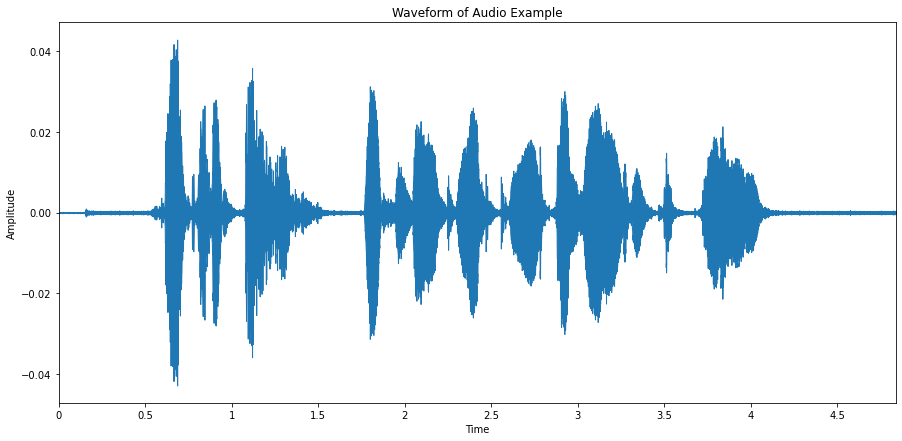

In [ ]:
%matplotlib inline
import librosa.display
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15,7)
plt.title('Waveform of Audio Example')
plt.ylabel('Amplitude')

_ = librosa.display.waveplot(audio)

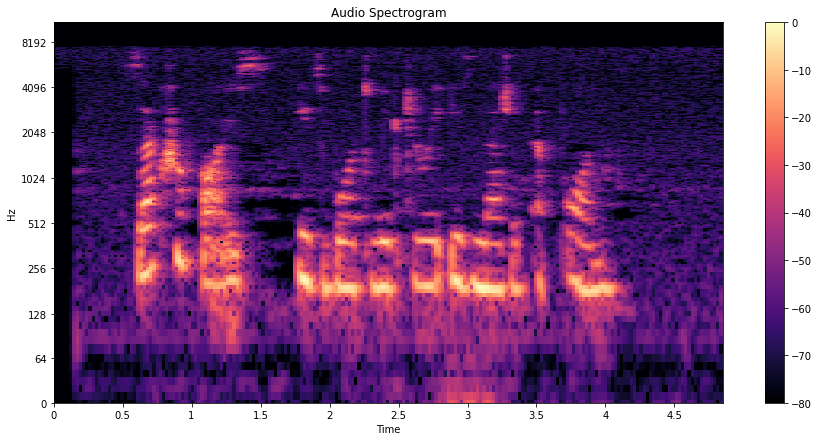

In [ ]:
import numpy as np

# Спектрограмма через кратковременное преобразование Фурье Short-Time Fourier Transform (stft)
spec = np.abs(librosa.stft(audio))
spec_db = librosa.amplitude_to_db(spec, ref=np.max)  # Децибел

# Для просмотра частот используем логарифмическую шкалу
librosa.display.specshow(spec_db, y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Audio Spectrogram');

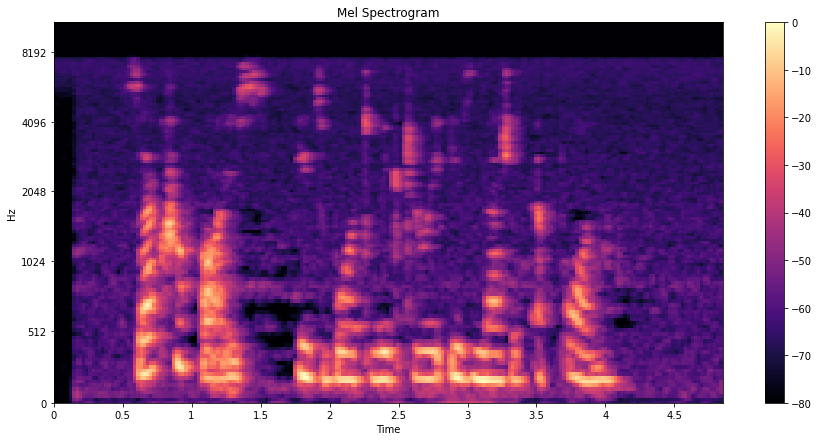

In [ ]:
# Мел-спектрограмма

mel_spec = librosa.feature.melspectrogram(audio, sr=sample_rate)
mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

librosa.display.specshow(
    mel_spec_db, x_axis='time', y_axis='mel')
plt.colorbar()
plt.title('Mel Spectrogram');

In [ ]:
import json

# Функция для создания манифест-файлов
def build_manifest(transcripts_path, manifest_name, wav_path):
    with open(transcripts_path, 'r') as fin:
        with open(manifest_name, 'w') as fout:
            for line in fin:
                transcript = line[line.find(':')+1 : ].lower()
                transcript = transcript.strip() 

                file_id = line[ : line.find(':')]  # напр., "019"
                audio_path = os.path.join(wav_path,
                    file_id + '.wav')

                duration = librosa.core.get_duration(filename=audio_path)

                # запишем метаданные в манифест
                metadata = {
                    "audio_filepath": audio_path,
                    "duration": duration,
                    "text": transcript
                }
                json.dump(metadata, fout)
                fout.write('\n')
                
# Создание манифест-файла
print("******")
test_transcripts = data_dir + '/datasets/transcription.txt'
test_manifest = data_dir + '/test_manifest.json'
wav_path = data_dir + '/datasets/my_en_audio'

if not os.path.isfile(test_manifest):
    build_manifest(test_transcripts, "test_manifest.json" , wav_path)
    print("Test manifest created.")
print("***Done***")

******
Test manifest created.
***Done***


In [ ]:
from collections import defaultdict
from tqdm.auto import tqdm

# функция для получения символов, используемых в тексте
def get_charset(manifest_data):
    charset = defaultdict(int)
    for row in tqdm(manifest_data, desc="Computing character set"):
        text = row['text']
        for character in text:
            charset[character] += 1
    return charset

In [ ]:
def read_manifest(path):
    manifest = []
    with open(path, 'r') as f:
        for line in tqdm(f, desc="Reading manifest data"):
            line = line.replace("\n", "")
            data = json.loads(line)
            manifest.append(data)
    return manifest

In [ ]:
# функция для записи обработанного манифеста
def write_processed_manifest(data, original_path):
    original_manifest_name = os.path.basename(original_path)
    new_manifest_name = original_manifest_name.replace(".json", "_processed.json")

    manifest_dir = os.path.split(original_path)[0]
    filepath = os.path.join(manifest_dir, new_manifest_name)
    with open(filepath, 'w') as f:
        for datum in tqdm(data, desc="Writing manifest data"):
            datum = json.dumps(datum)
            f.write(f"{datum}\n")
    print(f"Finished writing manifest: {filepath}")
    return filepath

In [ ]:
test_manifest_data = read_manifest(test_manifest)

test_charset = get_charset(test_manifest_data)

Reading manifest data: 0it [00:00, ?it/s]

Computing character set:   0%|          | 0/21 [00:00<?, ?it/s]

In [ ]:
test_set = set(test_charset.keys())
print(f"Number of tokens in test set : {len(test_set)}")
print(sorted(list(test_set)))

Number of tokens in test set : 31
[' ', "'", ',', '-', '.', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']


Удалим из манифест-файла все"неправильные" символы (',' '-' '.'), которых нет в лейблах предобученных моделей. То есть останутся только 26 букв английского алфавита, пробел и апостроф.

In [ ]:
# Предобработка 
import re
import unicodedata

chars_to_ignore_regex = '[\,\.\-]'  # удаление лишних символов

def remove_special_characters(data):
    data["text"] = re.sub(chars_to_ignore_regex, '', data["text"]).lower().strip()
    return data

In [ ]:
# Обработка манифестов
def apply_preprocessors(manifest, preprocessors):
    for processor in preprocessors:
        for idx in tqdm(range(len(manifest)), desc=f"Applying {processor.__name__}"):
            manifest[idx] = processor(manifest[idx])

    print("Finished processing manifest !")
    return manifest

In [ ]:
PREPROCESSORS = [
    remove_special_characters
]

In [ ]:
# Загрузка манифеста
test_data = read_manifest(test_manifest)

# Применение предобработки
test_data_processed = apply_preprocessors(test_data, PREPROCESSORS)

# Создание нового манифеста без лишних символов
test_manifest_cleaned = write_processed_manifest(test_data_processed, test_manifest)

Reading manifest data: 0it [00:00, ?it/s]

Applying remove_special_characters:   0%|          | 0/21 [00:00<?, ?it/s]

Finished processing manifest !


Writing manifest data:   0%|          | 0/21 [00:00<?, ?it/s]

Finished writing manifest: ./test_manifest_processed.json


In [ ]:
def get_audio_path(manifest_path, wav_path):
  audio_paths = []
  with open(manifest_path, 'r') as fin:
    for line  in fin:
      file_id = line[line.rfind('/')+1 : line.find('.wav')]  # напр., "012"
      audio_paths.append(os.path.join(wav_path,
                    file_id + '.wav'))
  return (audio_paths)

In [ ]:
# функция для получения текста-эталона
def get_ground_truth(manifest_path):
  ground_truth_lines = []
  with open(manifest_path, 'r') as fin:
    for line  in fin:
      text = line[line.find('"text": "')+9 : line.rfind('"')]  # "только текст" без кавычек
      ground_truth_lines.append(text)
  return (ground_truth_lines)

In [ ]:
# получим эталонные тексты из манифест-файла
ground_truth_list = get_ground_truth('./test_manifest_processed.json')

In [ ]:
ground_truth_list

['she has since hosted numerous variety shows and award shows in taiwan',
 'climate change results with more health care inequalities faced by persons with disabilities',
 'then the real trouble begins',
 'he was former director and chairman of gujarat state road transport corporation',
 'add paste and stir regularly until fragrant about five minutes',
 'sacrifice is what victory is measured upon',
 'reliability precision and innovation  three attributes that nurture and sustain lasting business relationships',
 'tension is mounting as the population of the entire planet waits for the next incident',
 'they were close friends in college but after graduation their lives diverged',
 "if we'd all work together i think we could accomplish our goal",
 'doctors are complaining that the system is cumbersome and bureaucratic',
 "he retaliated his neighbor's malicious destruction of his flower garden by cutting down the man's prize apple tree",
 'a lot of chemical reactions are reversible',
 "i

In [ ]:
test_manifest_proc = './test_manifest_processed.json'

# **Добавим шум в аудиозаписи**

In [ ]:
#загрузим необходимые данные из датасета Demand, воспользовавшись скриптом от NVIDIA
if not os.path.exists("scripts/get_demand_data.py"):
  !wget -P scripts/ https://raw.githubusercontent.com/NVIDIA/NeMo/main/scripts/dataset_processing/get_demand_data.py

--2022-04-21 08:36:04--  https://raw.githubusercontent.com/NVIDIA/NeMo/main/scripts/dataset_processing/get_demand_data.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5458 (5.3K) [text/plain]
Saving to: ‘scripts/get_demand_data.py’

get_demand_data.py  100%[===================>]   5.33K  --.-KB/s    in 0s      

2022-04-21 08:36:04 (76.5 MB/s) - ‘scripts/get_demand_data.py’ saved [5458/5458]



In [ ]:
%run -i scripts/get_demand_data.py \
    --data_root='./datasets' \
    --data_set='NRIVER'

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание аудиофайла
example_file = data_dir + '/datasets/NRIVER/ch01.wav'
audio, sample_rate = librosa.load(example_file)

ipd.Audio(example_file, rate=sample_rate)

In [ ]:
# Подготовим манифест-файл для нарезанных фрагментов шума

def write_manifest(filepath, data_dir='./datasets/manifests/', manifest_name='noise_manifest', duration_max=None, duration_stride=1.0, filter_long=False, duration_limit=10.0):
    if duration_max is None:
        duration_max = 1e9
                
    with open(os.path.join(data_dir, manifest_name + '.json'), 'w') as fout:
        
        try:
            x, _sr = librosa.load(filepath)
            duration = librosa.get_duration(x, sr=_sr)

        except Exception:
            print(f"\n>>>>>>>>> WARNING: Librosa failed to load file {filepath}. Skipping this file !\n")
            return

        if filter_long and duration > duration_limit:
            print(f"Skipping sound sample {filepath}, exceeds duration limit of {duration_limit}")
            return

        offsets = []
        durations = []

        if duration > duration_max:
            current_offset = 0.0

            while current_offset < duration:
                difference = duration - current_offset
                segment_duration = min(duration_max, difference)

                offsets.append(current_offset)
                durations.append(segment_duration)

                current_offset += duration_stride

        else:
            offsets.append(0.0)
            durations.append(duration)


        for duration, offset in zip(durations, offsets):
            metadata = {
                'audio_filepath': filepath,
                'duration': duration,
                'label': 'noise',
                'text': '_',  
                'offset': offset,
            }

            json.dump(metadata, fout)
            fout.write('\n')
            fout.flush()

        print(f"Wrote {len(durations)} segments for filename {filename}")
            
    print("Finished preparing manifest !")

In [ ]:
filename = 'ch01.wav'
filepath = os.path.join('./datasets/NRIVER/', filename)

# Write a "noise" manifest file
write_manifest(filepath, manifest_name='NRIVER', duration_max=3.0, duration_stride=3.0)

Wrote 101 segments for filename ch01.wav
Finished preparing manifest !


In [ ]:
noise_manifest_path = os.path.join(data_dir+'/datasets/manifests', 'NRIVER.json')

!head -n 5 {noise_manifest_path}

# чтение старого манифеста NRIVER

{"audio_filepath": "./datasets/NRIVER/ch01.wav", "text": "", "duration": 300.004}
{"audio_filepath": "./datasets/NRIVER/ch02.wav", "text": "", "duration": 300.004}
{"audio_filepath": "./datasets/NRIVER/ch03.wav", "text": "", "duration": 300.004}
{"audio_filepath": "./datasets/NRIVER/ch04.wav", "text": "", "duration": 300.004}
{"audio_filepath": "./datasets/NRIVER/ch05.wav", "text": "", "duration": 300.004}


In [ ]:
from nemo.collections.asr import parts

In [ ]:
import argparse
import copy
import json
import multiprocessing
import os
import random

import numpy as np
import soundfile as sf

from nemo.collections.asr.parts.preprocessing.segment import AudioSegment
from nemo.collections.asr.parts.preprocessing.perturb import NoisePerturbation

rng = None
att_factor = 0.8
sample_rate = 16000

In [ ]:
filename = 'ch01.wav'
filepath = os.path.join('datasets/NRIVER', filename)

In [ ]:
# Нарежем аудио ch01.wav с шумом реки на 10-секундные сегменты и 
# создадим манифест файл для шума
write_manifest(filepath, manifest_name='noise_10s', duration_max=10.0, duration_stride=10.0)

Wrote 31 segments for filename ch01.wav
Finished preparing manifest !


In [ ]:
noise_manifest_path = "/content/datasets/manifests/noise_10s.json"

!head -n 5 {noise_manifest_path}

head: cannot open '/content/datasets/manifests/noise_10s.json' for reading: No such file or directory


In [ ]:
def get_out_dir_name(out_dir, input_name, noise_name):
    return os.path.join(out_dir, input_name, noise_name)


def create_manifest(input_manifest, noise_manifest, out_path):
    os.makedirs(os.path.join(out_path, "manifests"), exist_ok=True)
    out_dir = get_out_dir_name(
        out_path,
        os.path.splitext(os.path.basename(input_manifest))[0],
        os.path.splitext(os.path.basename(noise_manifest))[0]
    )
    out_mfst = os.path.join(
        os.path.join(out_path, "manifests"),
        os.path.splitext(os.path.basename(input_manifest))[0]
        + "_"
        + os.path.splitext(os.path.basename(noise_manifest))[0]
        + ".json",
    )
    with open(input_manifest, "r") as inf, open(out_mfst, "w") as outf:
        for line in inf:
            row = json.loads(line.strip())
            row['audio_filepath'] = os.path.join(out_dir, os.path.basename(row['audio_filepath']))
            outf.write(json.dumps(row) + "\n")

In [ ]:
def process_row(row):
    audio_file = row['audio_filepath']
    global sample_rate
    data_orig = AudioSegment.from_file(audio_file, target_sr=sample_rate, offset=0)
    for snr in row['snrs']:
        min_snr_db = -10
        max_snr_db = 30
        global att_factor
        perturber = NoisePerturbation(
            manifest_path=row['noise_manifest'], min_snr_db=min_snr_db, max_snr_db=max_snr_db, rng=rng
        )
        out_dir = get_out_dir_name(
            row['out_dir'],
            os.path.splitext(os.path.basename(row['input_manifest']))[0],
            os.path.splitext(os.path.basename(row['noise_manifest']))[0]
        )
        os.makedirs(out_dir, exist_ok=True)
        out_f = os.path.join(out_dir, os.path.basename(audio_file))
        if os.path.exists(out_f):
            continue
        data = copy.deepcopy(data_orig)
        perturber.perturb(data)

        max_level = np.max(np.abs(data.samples))

        norm_factor = att_factor / max_level
        new_samples = norm_factor * data.samples
        sf.write(out_f, new_samples.transpose(), sample_rate)

In [ ]:
def add_noise(infile, snrs, noise_manifest, out_dir, num_workers=1):
    allrows = []

    with open(infile, "r") as inf:
        for line in inf:
            row = json.loads(line.strip())
            row['snrs'] = snrs
            row['out_dir'] = out_dir
            row['noise_manifest'] = noise_manifest
            row['input_manifest'] = infile
            allrows.append(row)
    pool = multiprocessing.Pool(num_workers)
    pool.map(process_row, allrows)
    pool.close()
    print('Done!')

In [ ]:
# наложим 10-секундные фрагменты шума реки на аудио из собственного датасета

input_manifest='/content/test_manifest_processed.json'
noise_manifest='/content/datasets/manifests/noise_10s.json'
out_dir=data_dir 
snr=[20]

add_noise(infile=input_manifest, snrs=snr, noise_manifest=noise_manifest, out_dir=out_dir, num_workers=1)
create_manifest(input_manifest=input_manifest, noise_manifest=noise_manifest, out_path=out_dir)

'''
в директории "./test_manifest_processed/noise_10s" 
будет располагаться 21 собственная аудиозапись с добавленным шумом
'''

[NeMo I 2022-04-21 08:45:29 collections:173] Dataset loaded with 31 files totalling 0.08 hours
[NeMo I 2022-04-21 08:45:29 collections:174] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 08:45:29 collections:173] Dataset loaded with 31 files totalling 0.08 hours
[NeMo I 2022-04-21 08:45:29 collections:174] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 08:45:29 collections:173] Dataset loaded with 31 files totalling 0.08 hours
[NeMo I 2022-04-21 08:45:29 collections:174] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 08:45:29 collections:173] Dataset loaded with 31 files totalling 0.08 hours
[NeMo I 2022-04-21 08:45:29 collections:174] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 08:45:29 collections:173] Dataset loaded with 31 files totalling 0.08 hours
[NeMo I 2022-04-21 08:45:29 collections:174] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 08:45:29 collections:173] Dataset loaded with 31 files totalling 0

'\nв директории "./test_manifest_processed/noise_10s" \nбудет располагаться 21 собственная аудиозапись с добавленным шумом\n'

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание зашумлённого аудиофайла
noisy_file = '/content/test_manifest_processed/noise_10s/014.wav'
audio, sample_rate = librosa.load(noisy_file)

ipd.Audio(noisy_file, rate=sample_rate)

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание чистого аудиофайла
clean_file = '/content/datasets/my_en_audio/014.wav'
audio, sample_rate = librosa.load(clean_file)

ipd.Audio(clean_file, rate=sample_rate)

# **Тестирование различных моделей**



1.   Загрузка предобученной модели
2.   Транскрибирование
3.   Оценка WER



In [ ]:
# Создадим директорию, где будем хранить манифесты, содержащие предсказанные моделью тексты
!mkdir -p output_manifests

In [ ]:
out_manifests_path = './output_manifests'

In [ ]:
!mkdir -p scripts
if not os.path.exists("scripts/transcribe_speech.py"):
  !wget -P scripts/ https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/transcribe_speech.py
if not os.path.exists("scripts/speech_to_text_eval.py"):
  !wget -P scripts/ https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/speech_to_text_eval.py

--2022-04-21 08:35:52--  https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/transcribe_speech.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9755 (9.5K) [text/plain]
Saving to: ‘scripts/transcribe_speech.py’

transcribe_speech.p 100%[===================>]   9.53K  --.-KB/s    in 0s      

2022-04-21 08:35:52 (55.1 MB/s) - ‘scripts/transcribe_speech.py’ saved [9755/9755]

--2022-04-21 08:35:52--  https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/speech_to_text_eval.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 

In [ ]:
noisy_wav_path = "./test_manifest_processed/noise_10s"

In [ ]:
noisy_test_files = get_audio_path("./manifests/test_manifest_processed_noise_10s.json", noisy_wav_path)

In [ ]:
noisy_test_files

['./test_manifest_processed/noise_10s/001.wav',
 './test_manifest_processed/noise_10s/002.wav',
 './test_manifest_processed/noise_10s/003.wav',
 './test_manifest_processed/noise_10s/004.wav',
 './test_manifest_processed/noise_10s/005.wav',
 './test_manifest_processed/noise_10s/006.wav',
 './test_manifest_processed/noise_10s/007.wav',
 './test_manifest_processed/noise_10s/008.wav',
 './test_manifest_processed/noise_10s/009.wav',
 './test_manifest_processed/noise_10s/010.wav',
 './test_manifest_processed/noise_10s/011.wav',
 './test_manifest_processed/noise_10s/012.wav',
 './test_manifest_processed/noise_10s/013.wav',
 './test_manifest_processed/noise_10s/014.wav',
 './test_manifest_processed/noise_10s/015.wav',
 './test_manifest_processed/noise_10s/016.wav',
 './test_manifest_processed/noise_10s/017.wav',
 './test_manifest_processed/noise_10s/018.wav',
 './test_manifest_processed/noise_10s/019.wav',
 './test_manifest_processed/noise_10s/020.wav',
 './test_manifest_processed/noise_10s/02

In [ ]:
test_manifest_proc_noise = data_dir+"/manifests/test_manifest_processed_noise_10s.json"

In [ ]:
get_ground_truth(test_manifest_proc_noise)

['she has since hosted numerous variety shows and award shows in taiwan',
 'climate change results with more health care inequalities faced by persons with disabilities',
 'then the real trouble begins',
 'he was former director and chairman of gujarat state road transport corporation',
 'add paste and stir regularly until fragrant about five minutes',
 'sacrifice is what victory is measured upon',
 'reliability precision and innovation  three attributes that nurture and sustain lasting business relationships',
 'tension is mounting as the population of the entire planet waits for the next incident',
 'they were close friends in college but after graduation their lives diverged',
 "if we'd all work together i think we could accomplish our goal",
 'doctors are complaining that the system is cumbersome and bureaucratic',
 "he retaliated his neighbor's malicious destruction of his flower garden by cutting down the man's prize apple tree",
 'a lot of chemical reactions are reversible',
 "i

## Jasper

In [ ]:
jasper_en = nemo_asr.models.EncDecCTCModel.from_pretrained(model_name="stt_en_jasper10x5dr")

[NeMo I 2022-04-21 08:53:39 cloud:56] Found existing object /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo.
[NeMo I 2022-04-21 08:53:39 cloud:62] Re-using file from: /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo
[NeMo I 2022-04-21 08:53:39 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 08:53:51 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 08:53:51 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    
[NeMo W 2022-04-21 08:53:51 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/voices/train_1k.json
    sample_rate: 

[NeMo I 2022-04-21 08:53:51 features:259] PADDING: 16
[NeMo I 2022-04-21 08:53:51 features:276] STFT using torch
[NeMo I 2022-04-21 08:53:58 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 08:54:14 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo.


In [ ]:
jasper_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, jasper_en.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  jasper_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she fer sie posted oi o show a woll trees in comon. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change will results with more healthare inequalities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: ut then the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gujarat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add poast and stir regularly until pregrant about fiv

In [ ]:
jasper_output_manifest=out_manifests_path+"/noise_jasper_output_manifest.json"
jasper_model="stt_en_jasper10x5dr" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$jasper_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$jasper_output_manifest

[NeMo I 2022-04-21 08:58:36 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_jasper10x5dr
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_jasper_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
        ma

[NeMo W 2022-04-21 08:58:48 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 08:58:48 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    
[NeMo W 2022-04-21 08:58:49 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/voices/train_1k.json
    sample_rate: 

[NeMo I 2022-04-21 08:58:49 features:259] PADDING: 16
[NeMo I 2022-04-21 08:58:49 features:276] STFT using torch
[NeMo I 2022-04-21 08:58:55 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 08:58:56 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 08:58:56 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 08:58:56 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 08:58:57 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 08:58:57 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_jasper_output_manifest.json
[NeMo I 2022-04-21 08:58:57 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$jasper_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 08:58:57 speech_to_text_eval:145] Got WER of 0.4742647058823529


## QuartzNet

In [ ]:
quartznet_en = nemo_asr.models.EncDecCTCModel.from_pretrained(model_name="QuartzNet15x5Base-En")

[NeMo I 2022-04-21 08:55:36 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemospeechmodels/versions/1.0.0a5/files/QuartzNet15x5Base-En.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo
[NeMo I 2022-04-21 08:55:41 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 08:55:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 08:55:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 08:55:42 features:259] PADDING: 16
[NeMo I 2022-04-21 08:55:42 features:276] STFT using torch
[NeMo I 2022-04-21 08:55:42 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 08:55:43 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo.


In [ ]:
quartznet_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, quartznet_en.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  quartznet_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she hastee posted inteat around the show and a watch ase in oman. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change results with more healthcare inequalities plaised by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chiiman of gujharad state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add paste and stir regularly until prigrant 

In [ ]:
quartznet_pred

['she hastee posted inteat around the show and a watch ase in oman',
 'climate change results with more healthcare inequalities plaised by persons with disabilities',
 'then the real trouble begins',
 'he was former director and chiiman of gujharad state road transport corporation',
 'add paste and stir regularly until prigrant about five minutes',
 'sacrifice its bot lictory is matured a forme',
 'reliability precision and innovation three attritutes aledt mutar ancestri losting business relationship',
 'dension is known to as the population of the entire corranagrates for the next incident',
 'they were close friends in college but after graduation thevise divorced',
 "if we'e all work together i think we could accomplish our goal",
 'doctors are complaining that he system is cumbersong an geocradic',
 "he reitariated his neighbours mariship estruction ofer his fowergarden by cutting down the man's bright apple tree",
 'a lot of chemical reactions are reversible',
 'ol e botin we are

In [ ]:
quartznet_output_manifest=out_manifests_path+"/noise_quartznet_output_manifest.json"
quartznet_model="QuartzNet15x5Base-En" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$quartznet_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$quartznet_output_manifest

[NeMo I 2022-04-21 08:56:15 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: QuartzNet15x5Base-En
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_quartznet_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
      

[NeMo W 2022-04-21 08:56:16 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 08:56:16 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 08:56:16 features:259] PADDING: 16
[NeMo I 2022-04-21 08:56:16 features:276] STFT using torch
[NeMo I 2022-04-21 08:56:17 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 08:56:17 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 08:56:17 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 08:56:17 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 08:56:17 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 08:56:17 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_quartznet_output_manifest.json
[NeMo I 2022-04-21 08:56:17 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$quartznet_output_manifest \
    use_cer=False \
    only_score_manifest=True

[NeMo I 2022-04-21 08:56:24 speech_to_text_eval:145] Got WER of 0.4411764705882353


## Citrinet 256

In [ ]:
citrinet_256 = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_256")

[NeMo I 2022-04-21 08:56:36 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_256/versions/1.0.0rc1/files/stt_en_citrinet_256.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256/91a9cc5850784b2065e8a0aa3d526fd9/stt_en_citrinet_256.nemo
[NeMo I 2022-04-21 08:56:40 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 08:56:41 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 08:56:41 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 08:56:41 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 08:56:42 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 08:56:42 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 08:56:42 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 08:56:42 features:259] PADDING: 16
[NeMo I 2022-04-21 08:56:42 features:276] STFT using torch
[NeMo I 2022-04-21 08:56:42 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 08:56:43 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256/91a9cc5850784b2065e8a0aa3d526fd9/stt_en_citrinet_256.nemo.


In [ ]:
citrinet_256_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_256.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_256_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she actuallyed posted interualis shows and a watchs in one. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change or results with more healthcare inequalities bad by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: the then the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gujarat state road transport corporation.. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: and faceced and stir regularly until fragrant 

In [ ]:
citrinet_256_output_manifest=out_manifests_path+"/noise_citrinet_256_output_manifest.json"
citrinet_256_model="stt_en_citrinet_256" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_256_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_256_output_manifest

[NeMo I 2022-04-21 09:00:00 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_256
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_citrinet_256_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
    

[NeMo W 2022-04-21 09:00:02 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:00:02 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:00:02 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:00:02 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:00:02 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:00:02 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 09:00:02 features:259] PADDING: 16
[NeMo I 2022-04-21 09:00:02 features:276] STFT using torch
[NeMo I 2022-04-21 09:00:03 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:00:04 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256/91a9cc5850784b2065e8a0aa3d526fd9/stt_en_citrinet_256.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:00:04 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:00:04 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:00:04 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:00:04 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_256_output_manifest.json
[NeMo I 2022-04-21 09:00:04 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_256_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:00:14 speech_to_text_eval:145] Got WER of 0.4485294117647059


## Citrinet 512

In [ ]:
citrinet_512 = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_512")

[NeMo I 2022-04-21 09:00:23 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_512/versions/1.0.0rc1/files/stt_en_citrinet_512.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512/3262321355385bb7cf5a583146117d77/stt_en_citrinet_512.nemo
[NeMo I 2022-04-21 09:00:30 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:00:32 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:00:32 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:00:32 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:00:33 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    
[NeMo W 2022-04-21 09:00:33 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    
[NeMo W 2022-04-21 09:00:33 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a valid configuration file to setup the test data loader(s).
    T

[NeMo I 2022-04-21 09:00:33 features:259] PADDING: 16
[NeMo I 2022-04-21 09:00:33 features:276] STFT using torch
[NeMo I 2022-04-21 09:00:34 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:00:35 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512/3262321355385bb7cf5a583146117d77/stt_en_citrinet_512.nemo.


In [ ]:
citrinet_512_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_512.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_512_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she has been posted in asation and awards in her min.. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change results with more health air in qualities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then a the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gujarard state road transport corporation.. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add paste and stir regularly until fragrant about fiv

In [ ]:
citrinet_512_output_manifest=out_manifests_path+"/noise_citrinet_512_output_manifest.json"
citrinet_512_model="stt_en_citrinet_512" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_512_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_512_output_manifest

[NeMo I 2022-04-21 09:01:22 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_512
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_citrinet_512_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
    

[NeMo W 2022-04-21 09:01:24 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:01:24 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:01:24 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:01:25 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    
[NeMo W 2022-04-21 09:01:25 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    
[NeMo W 2022-04-21 09:01:25 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a valid configuration file to setup the test data loader(s).
    T

[NeMo I 2022-04-21 09:01:25 features:259] PADDING: 16
[NeMo I 2022-04-21 09:01:25 features:276] STFT using torch
[NeMo I 2022-04-21 09:01:26 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:01:27 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512/3262321355385bb7cf5a583146117d77/stt_en_citrinet_512.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:01:27 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:01:27 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:01:27 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:01:27 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_512_output_manifest.json
[NeMo I 2022-04-21 09:01:27 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_512_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:01:36 speech_to_text_eval:145] Got WER of 0.4485294117647059


## Citrinet 1024


In [ ]:
citrinet_1024 = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_1024")

[NeMo I 2022-04-21 09:01:47 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_1024/versions/1.0.0rc1/files/stt_en_citrinet_1024.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024/86acfaf495a53383369fb6c9c547b8dd/stt_en_citrinet_1024.nemo
[NeMo I 2022-04-21 09:02:06 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:02:16 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:02:16 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:02:16 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:02:16 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:02:16 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:02:16 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 09:02:16 features:259] PADDING: 16
[NeMo I 2022-04-21 09:02:16 features:276] STFT using torch
[NeMo I 2022-04-21 09:02:20 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:02:21 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024/86acfaf495a53383369fb6c9c547b8dd/stt_en_citrinet_1024.nemo.


In [ ]:
citrinet_1024_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_1024.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_1024_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she has since posted inmaized shows and a watches in her wife.. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change results with more healthcare inequalities placed by persons with disabilities.. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then a the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of guar state road transport corporation.. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add paste and stir regularly until fragrant ab

In [ ]:
citrinet_1024_output_manifest=out_manifests_path+"/noise_citrinet_1024_output_manifest.json"
citrinet_1024_model="stt_en_citrinet_1024" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_1024_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_1024_output_manifest

[NeMo I 2022-04-21 09:02:45 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_1024
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_citrinet_1024_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
  

[NeMo W 2022-04-21 09:02:50 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:02:50 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:02:50 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:02:51 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:02:51 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:02:51 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 09:02:51 features:259] PADDING: 16
[NeMo I 2022-04-21 09:02:51 features:276] STFT using torch
[NeMo I 2022-04-21 09:02:54 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:02:55 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024/86acfaf495a53383369fb6c9c547b8dd/stt_en_citrinet_1024.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:02:55 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:02:55 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:02:56 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:02:56 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_1024_output_manifest.json
[NeMo I 2022-04-21 09:02:56 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_1024_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:02:56 speech_to_text_eval:145] Got WER of 0.4264705882352941


## Citrinet 256 gamma 0.25

In [ ]:
citrinet_256_gamma = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_256_gamma_0_25")

[NeMo I 2022-04-21 09:03:02 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_256_gamma_0_25/versions/1.0.0/files/stt_en_citrinet_256_gamma_0_25.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256_gamma_0_25/d6eff3868f2f7a4791eb935c8366fc46/stt_en_citrinet_256_gamma_0_25.nemo
[NeMo I 2022-04-21 09:03:06 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:03:07 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:03:07 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:03:07 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:03:08 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:03:08 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:03:08 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 09:03:08 features:259] PADDING: 16
[NeMo I 2022-04-21 09:03:08 features:276] STFT using torch
[NeMo I 2022-04-21 09:03:08 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:03:09 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256_gamma_0_25/d6eff3868f2f7a4791eb935c8366fc46/stt_en_citrinet_256_gamma_0_25.nemo.


In [ ]:
citrinet_256_gamma_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_256_gamma.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_256_gamma_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she had been closesty last moation and a watchs andman. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change results with more health care and qualities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: again a very real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gujarat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: and faced and stir regularly until pregrant about 

In [ ]:
citrinet_256_gamma_output_manifest=out_manifests_path+"/noise_citrinet_256_gamma_output_manifest.json"
citrinet_256_gamma_model="stt_en_citrinet_256_gamma_0_25" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_256_gamma_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_256_gamma_output_manifest

[NeMo I 2022-04-21 09:03:47 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_256_gamma_0_25
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_citrinet_256_gamma_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansio

[NeMo W 2022-04-21 09:03:48 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:03:48 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:03:48 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:03:49 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:03:49 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:03:49 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 09:03:49 features:259] PADDING: 16
[NeMo I 2022-04-21 09:03:49 features:276] STFT using torch
[NeMo I 2022-04-21 09:03:50 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:03:50 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256_gamma_0_25/d6eff3868f2f7a4791eb935c8366fc46/stt_en_citrinet_256_gamma_0_25.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:03:50 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:03:50 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:03:50 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:03:50 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_256_gamma_output_manifest.json
[NeMo I 2022-04-21 09:03:50 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_256_gamma_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:03:57 speech_to_text_eval:145] Got WER of 0.44485294117647056


## Citrinet 512 gamma 0.25

In [ ]:
citrinet_512_gamma = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_512_gamma_0_25")

[NeMo I 2022-04-21 09:04:03 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_512_gamma_0_25/versions/1.0.0/files/stt_en_citrinet_512_gamma_0_25.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512_gamma_0_25/1497f738f22b48b92849481b7b5100e4/stt_en_citrinet_512_gamma_0_25.nemo
[NeMo I 2022-04-21 09:04:09 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:04:11 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:04:11 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:04:11 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:04:12 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:04:12 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:04:12 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 09:04:12 features:259] PADDING: 16
[NeMo I 2022-04-21 09:04:12 features:276] STFT using torch
[NeMo I 2022-04-21 09:04:13 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:04:14 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512_gamma_0_25/1497f738f22b48b92849481b7b5100e4/stt_en_citrinet_512_gamma_0_25.nemo.


In [ ]:
citrinet_512_gamma_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_512_gamma.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_512_gamma_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she has posted nationalizations and avtors in. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change results with more health care in qualities placed by persons with dissabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gojarad state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: and face and stir regularly until pragrant about five minutes.

In [ ]:
citrinet_512_gamma_output_manifest=out_manifests_path+"/noise_citrinet_512_gamma_output_manifest.json"
citrinet_512_gamma_model="stt_en_citrinet_512_gamma_0_25" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_512_gamma_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_512_gamma_output_manifest

[NeMo I 2022-04-21 09:04:42 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_512_gamma_0_25
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_citrinet_512_gamma_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansio

[NeMo W 2022-04-21 09:04:44 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:04:44 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:04:44 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:04:44 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:04:44 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:04:44 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 09:04:44 features:259] PADDING: 16
[NeMo I 2022-04-21 09:04:44 features:276] STFT using torch
[NeMo I 2022-04-21 09:04:46 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:04:46 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512_gamma_0_25/1497f738f22b48b92849481b7b5100e4/stt_en_citrinet_512_gamma_0_25.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:04:46 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:04:46 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:04:47 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:04:47 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_512_gamma_output_manifest.json
[NeMo I 2022-04-21 09:04:47 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_512_gamma_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:04:51 speech_to_text_eval:145] Got WER of 0.39338235294117646


## Citrinet 1024 gamma 0.25


In [ ]:
citrinet_1024_gamma = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_1024_gamma_0_25")

[NeMo I 2022-04-21 09:04:56 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_1024_gamma_0_25/versions/1.0.0/files/stt_en_citrinet_1024_gamma_0_25.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024_gamma_0_25/a31810fe7dd91146ddb79361b5cc8907/stt_en_citrinet_1024_gamma_0_25.nemo
[NeMo I 2022-04-21 09:05:13 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:05:23 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:05:23 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:05:23 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:05:24 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:05:24 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:05:24 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 09:05:24 features:259] PADDING: 16
[NeMo I 2022-04-21 09:05:24 features:276] STFT using torch
[NeMo I 2022-04-21 09:05:27 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:05:28 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024_gamma_0_25/a31810fe7dd91146ddb79361b5cc8907/stt_en_citrinet_1024_gamma_0_25.nemo.


In [ ]:
citrinet_1024_gamma_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_1024_gamma.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_1024_gamma_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she had this postive inisations and a w in her month. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change or results with more healthca inqulities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gujarat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add paste and stir regularly until fragrant about five minu

In [ ]:
citrinet_1024_gamma_output_manifest=out_manifests_path+"/noise_citrinet_1024_gamma_output_manifest.json"
citrinet_1024_gamma_model="stt_en_citrinet_1024_gamma_0_25" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_1024_gamma_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_1024_gamma_output_manifest

[NeMo I 2022-04-21 09:05:45 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_1024_gamma_0_25
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_citrinet_1024_gamma_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expans

[NeMo W 2022-04-21 09:05:51 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:05:51 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:05:51 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:05:51 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:05:51 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:05:51 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 09:05:51 features:259] PADDING: 16
[NeMo I 2022-04-21 09:05:51 features:276] STFT using torch
[NeMo I 2022-04-21 09:05:54 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:05:55 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024_gamma_0_25/a31810fe7dd91146ddb79361b5cc8907/stt_en_citrinet_1024_gamma_0_25.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:05:55 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:05:55 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:05:56 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:05:56 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_1024_gamma_output_manifest.json
[NeMo I 2022-04-21 09:05:56 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_1024_gamma_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:06:01 speech_to_text_eval:145] Got WER of 0.3786764705882353


## Conformer-CTC small LS

In [ ]:
conformer_ctc_small_ls = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_small_ls")

[NeMo I 2022-04-21 09:06:14 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_small_ls/versions/1.0.0/files/stt_en_conformer_ctc_small_ls.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small_ls/cf1b6bbcc08433257c12442c92b9996a/stt_en_conformer_ctc_small_ls.nemo
[NeMo I 2022-04-21 09:06:18 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:06:18 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:06:18 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:06:18 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 09:06:18 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 09:06:19 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 09:06:19 features:259] PADDING: 0
[NeMo I 2022-04-21 09:06:19 features:276] STFT using torch
[NeMo I 2022-04-21 09:06:19 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:06:19 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small_ls/cf1b6bbcc08433257c12442c92b9996a/stt_en_conformer_ctc_small_ls.nemo.


In [ ]:
conformer_ctc_small_ls_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_small_ls.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_small_ls_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she had beupposed with ing was what i was sare and oll she is in my mind. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: clamor change for resorlds leak more health gear and qualities paced by persons with visibilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: and then a very ill trouble of the peace. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was form a direct and chiairmen of gugeatt's state arode transport coperation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add beast and stir 

In [ ]:
conformer_ctc_small_ls_output_manifest=out_manifests_path+"/noise_conformer_ctc_small_ls_output_manifest.json"
conformer_ctc_small_ls_model="stt_en_conformer_ctc_small_ls" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_small_ls_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_small_ls_output_manifest

[NeMo I 2022-04-21 09:07:08 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_small_ls
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_conformer_ctc_small_ls_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expan

[NeMo W 2022-04-21 09:07:09 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:07:09 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:07:10 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 09:07:10 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 09:07:10 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 09:07:10 features:259] PADDING: 0
[NeMo I 2022-04-21 09:07:10 features:276] STFT using torch
[NeMo I 2022-04-21 09:07:10 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:07:11 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small_ls/cf1b6bbcc08433257c12442c92b9996a/stt_en_conformer_ctc_small_ls.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:07:11 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:07:11 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:07:11 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:07:11 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_small_ls_output_manifest.json
[NeMo I 2022-04-21 09:07:11 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_small_ls_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:07:17 speech_to_text_eval:145] Got WER of 0.6654411764705882


## Conformer-CTC large LS

In [ ]:
conformer_ctc_large_ls = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_large_ls")

[NeMo I 2022-04-21 09:07:22 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_large_ls/versions/1.0.0/files/stt_en_conformer_ctc_large_ls.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large_ls/1ea6a779af1742c38ff9945aa70b3dc3/stt_en_conformer_ctc_large_ls.nemo
[NeMo I 2022-04-21 09:07:37 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:07:44 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:07:44 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:07:44 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 09:07:45 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 09:07:45 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 09:07:45 features:259] PADDING: 0
[NeMo I 2022-04-21 09:07:45 features:276] STFT using torch
[NeMo I 2022-04-21 09:07:47 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:07:48 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large_ls/1ea6a779af1742c38ff9945aa70b3dc3/stt_en_conformer_ctc_large_ls.nemo.


In [ ]:
conformer_ctc_large_ls_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_large_ls.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_large_ls_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she cud thinposed with ps what aunti sos hand her w ches him once. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: clima change will results with more healthier and qualities pleaced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: agan a very ial trouble the gised. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairmen of gujard state road transport co operation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add faste and stir irregularly unti

In [ ]:
conformer_ctc_large_ls_output_manifest=out_manifests_path+"/noise_conformer_ctc_large_ls_output_manifest.json"
conformer_ctc_large_ls_model="stt_en_conformer_ctc_large_ls" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_large_ls_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_large_ls_output_manifest

[NeMo I 2022-04-21 09:08:06 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_large_ls
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_conformer_ctc_large_ls_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expan

[NeMo W 2022-04-21 09:08:10 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:08:10 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:08:10 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 09:08:10 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 09:08:10 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 09:08:10 features:259] PADDING: 0
[NeMo I 2022-04-21 09:08:10 features:276] STFT using torch
[NeMo I 2022-04-21 09:08:11 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:08:12 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large_ls/1ea6a779af1742c38ff9945aa70b3dc3/stt_en_conformer_ctc_large_ls.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:08:12 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:08:12 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:08:14 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:08:14 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_large_ls_output_manifest.json
[NeMo I 2022-04-21 09:08:14 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_large_ls_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:08:14 speech_to_text_eval:145] Got WER of 0.5441176470588235


## Conformer-CTC small

In [ ]:
conformer_ctc_small = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_small")

[NeMo I 2022-04-21 09:08:23 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_small/versions/1.6.0/files/stt_en_conformer_ctc_small.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small/5d2d8e5b2b5adb8f5091363c6ba19c55/stt_en_conformer_ctc_small.nemo
[NeMo I 2022-04-21 09:08:27 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:08:28 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:08:28 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:08:28 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:08:29 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 64
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 09:08:29 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 09:08:29 features:259] PADDING: 0
[NeMo I 2022-04-21 09:08:29 features:276] STFT using torch
[NeMo I 2022-04-21 09:08:29 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:08:29 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small/5d2d8e5b2b5adb8f5091363c6ba19c55/stt_en_conformer_ctc_small.nemo.


In [ ]:
conformer_ctc_small_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_small.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_small_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she has this house to e us mo our dishes um a ros in her month. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change will results with more health care inequalities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then of the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gogeert state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add paas and stir regularly until fragr

In [ ]:
conformer_ctc_small_output_manifest=out_manifests_path+"/noise_conformer_ctc_small_output_manifest.json"
conformer_ctc_small_model="stt_en_conformer_ctc_small" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_small_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_small_output_manifest

[NeMo I 2022-04-21 09:09:03 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_small
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_conformer_ctc_small_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_g

[NeMo W 2022-04-21 09:09:03 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:09:03 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:09:04 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:09:04 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 64
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 09:09:04 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 09:09:04 features:259] PADDING: 0
[NeMo I 2022-04-21 09:09:04 features:276] STFT using torch
[NeMo I 2022-04-21 09:09:05 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:09:05 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small/5d2d8e5b2b5adb8f5091363c6ba19c55/stt_en_conformer_ctc_small.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:09:05 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:09:05 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:09:06 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:09:06 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_small_output_manifest.json
[NeMo I 2022-04-21 09:09:06 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_small_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:09:10 speech_to_text_eval:145] Got WER of 0.3713235294117647


## Conformer-CTC large

In [ ]:
conformer_ctc_large = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_large")

[NeMo I 2022-04-21 09:09:19 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_large/versions/1.6.0/files/stt_en_conformer_ctc_large.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large/010120d9959425c7862c9843960b3235/stt_en_conformer_ctc_large.nemo
[NeMo I 2022-04-21 09:09:36 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:09:43 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:09:43 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:09:43 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 09:09:43 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 09:09:43 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 09:09:43 features:259] PADDING: 0
[NeMo I 2022-04-21 09:09:43 features:276] STFT using torch
[NeMo I 2022-04-21 09:09:44 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:09:45 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large/010120d9959425c7862c9843960b3235/stt_en_conformer_ctc_large.nemo.


In [ ]:
conformer_ctc_large_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_large.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_large_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: she has been hous making us lot of dishes and a wachs in he month. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_10s/002.wav was recognized as: climate change will result with more health care inequalities raced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_10s/003.wav was recognized as: then the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_10s/004.wav was recognized as: he was former director and chairman of gujarat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_10s/005.wav was recognized as: add paste and stir regularly until fragr

In [ ]:
conformer_ctc_large_output_manifest=out_manifests_path+"/noise_conformer_ctc_large_output_manifest.json"
conformer_ctc_large_model="stt_en_conformer_ctc_large" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_large_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_large_output_manifest

[NeMo I 2022-04-21 09:10:01 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_large
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_conformer_ctc_large_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_g

[NeMo W 2022-04-21 09:10:06 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:10:06 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:10:06 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 09:10:06 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 09:10:06 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 09:10:06 features:259] PADDING: 0
[NeMo I 2022-04-21 09:10:06 features:276] STFT using torch
[NeMo I 2022-04-21 09:10:07 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:10:08 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large/010120d9959425c7862c9843960b3235/stt_en_conformer_ctc_large.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:10:08 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:10:08 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:10:09 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:10:09 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_large_output_manifest.json
[NeMo I 2022-04-21 09:10:09 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_large_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:10:18 speech_to_text_eval:145] Got WER of 0.2867647058823529


## Contextnet 256

In [ ]:
contextnet_256 = nemo_asr.models.EncDecRNNTBPEModel.from_pretrained(model_name="stt_en_contextnet_256")

[NeMo I 2022-04-21 09:10:23 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_contextnet_256/versions/1.6.0/files/stt_en_contextnet_256.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_contextnet_256/bec0c4dd71d3e3cf5dd20458ed251a89/stt_en_contextnet_256.nemo
[NeMo I 2022-04-21 09:10:27 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:10:28 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:10:28 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:10:29 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:10:29 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:10:29 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:10:29 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple

[NeMo I 2022-04-21 09:10:29 features:259] PADDING: 16
[NeMo I 2022-04-21 09:10:29 features:276] STFT using torch


[NeMo W 2022-04-21 09:10:30 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 09:10:30 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.001}
[NeMo I 2022-04-21 09:10:30 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:10:31 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_contextnet_256/bec0c4dd71d3e3cf5dd20458ed251a89/stt_en_contextnet_256.nemo.


In [ ]:
contextnet_256_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, contextnet_256.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  contextnet_256_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: ['she first i was still thinking was what i should uh watch this before one', 'climate change results with more health care inequalities raised by persons with disabilities', 'again a real trouble begins', 'he was former director and chairman of gujarat state road transport corporation', 'add beast and stir regularly until fragrant about five minutes', 'sacrifice his bottom victory is measured upon', 'reliability precision and innovation free attributes adapt nurture ancestry lasting business relationship', 'dunshon is mounting as the population of the entire clean of woods for the next incident', 'they were close friends in college but after graduation their lives diverged', "if we'd all work together i think we could accomplish our goal", 'doctors are complaining that he assisted his cumbersome and bureaucratic', "he retaliated his neighbor's maryship with structure of his flower garden by cutting down in man's b

In [ ]:
contextnet_256_output_manifest=out_manifests_path+"/noise_contextnet_256_output_manifest.json"
contextnet_256_model="stt_en_contextnet_256" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$contextnet_256_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$contextnet_256_output_manifest

[NeMo I 2022-04-21 09:11:15 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_contextnet_256
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_contextnet_256_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3


[NeMo W 2022-04-21 09:11:16 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:11:16 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:11:17 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:11:17 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:11:17 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 09:11:17 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple

[NeMo I 2022-04-21 09:11:17 features:259] PADDING: 16
[NeMo I 2022-04-21 09:11:17 features:276] STFT using torch


[NeMo W 2022-04-21 09:11:19 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 09:11:19 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.001}
[NeMo I 2022-04-21 09:11:19 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:11:20 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_contextnet_256/bec0c4dd71d3e3cf5dd20458ed251a89/stt_en_contextnet_256.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:11:20 rnnt_wer:366] Joint fused batch size <= 0; Will temporarily disable fused batch step in the Joint.
[NeMo I 2022-04-21 09:11:20 rnnt_bpe_models:377] Changed decoding strategy to 
    strategy: greedy_batch
    compute_hypothesis_token_set: false
    preserve_alignments: null
    fused_batch_size: -1
    greedy:
      max_symbols_per_step: 10
      preserve_alignments: false
    beam:
      beam_size: 4
      search_type: default
      score_norm: true
      return_best_hypothesis: true
      tsd_max_sym_exp_per_step: 50
      alsd_max_target_len: 1.0
      nsc_max_timesteps_expansion: 1
      nsc_prefix_alpha: 1
      maes_num_steps: 2
      maes_prefix_alpha: 1
      maes_expansion_gamma: 2.3
      maes_expansion_beta: 2
      language_model: null
      softmax_temperature: 1.0
      preserve_alignments: false
    
[NeMo I 2022-04-21 09:11:20 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:11:20 transcribe_speech:176] AMP enab

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:11:21 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:11:21 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_contextnet_256_output_manifest.json
[NeMo I 2022-04-21 09:11:21 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$contextnet_256_output_manifest \
    use_cer=False \
    only_score_manifest=True 


[NeMo I 2022-04-21 09:11:28 speech_to_text_eval:145] Got WER of 0.3786764705882353


## Conformer-Transducer small

In [ ]:
conformer_tr_small = nemo_asr.models.EncDecRNNTBPEModel.from_pretrained(model_name="stt_en_conformer_transducer_small")

[NeMo I 2022-04-21 09:11:35 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_transducer_small/versions/1.6.0/files/stt_en_conformer_transducer_small.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_transducer_small/a755afe69952642a8410330876938b83/stt_en_conformer_transducer_small.nemo
[NeMo I 2022-04-21 09:11:40 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 09:11:41 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:11:41 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:11:42 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:11:42 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/nemo_asr_set_2.0/RES/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 4
    pin_memory: true
    use_start_end_token: true
    trim_silence: false
    max_duration: 20
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data2/nemo_asr_set_2.0/RES/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 09:11:42 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manifest

[NeMo I 2022-04-21 09:11:42 features:259] PADDING: 0
[NeMo I 2022-04-21 09:11:42 features:276] STFT using torch


[NeMo W 2022-04-21 09:11:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
      "num_layers={}".format(dropout, num_layers))
    
[NeMo W 2022-04-21 09:11:43 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 09:11:43 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.0}
[NeMo I 2022-04-21 09:11:43 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:11:43 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_transducer_small/a755afe69952642a8410330876938b83/stt_en_conformer_transducer_small.nemo.


In [ ]:
conformer_tr_small_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_tr_small.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_tr_small_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_10s/001.wav was recognized as: ['she has this house within a dishes um overnight', 'climate change results with more health air inequalities faced by persons with disabilities', 'the real trouble begins', 'he was former director and chairman of gougerot state road transport corporation', 'add paced and stir regularly until pregrant about five minutes', 'sacrifice its board victory is measured upon', 'reliability precision and innovation three attributes as yet nurture and sustain lasting business relationship', 'tension is mounting as the population of the entire incident', 'they were close friends in college but after graduation their voice diverged', "if we'd all work together i think we could accomplish our go", 'doctors are complaining that the assistant is cumbersome and bureaucratic', "he retaliated his neighbours smolishes the destruction of his flower carting by cutting down the man's bright apple tree", 'a lot of chemical reactions are 

In [ ]:
conformer_tr_small_output_manifest=out_manifests_path+"/noise_conformer_tr_small_output_manifest.json"
conformer_tr_small_model="stt_en_conformer_transducer_small" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_tr_small_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_tr_small_output_manifest

[NeMo I 2022-04-21 09:12:41 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_transducer_small
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_10s.json
    output_filename: ./output_manifests/noise_conformer_tr_small_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expan

[NeMo W 2022-04-21 09:12:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 09:12:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 09:12:42 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 09:12:43 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/nemo_asr_set_2.0/RES/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 4
    pin_memory: true
    use_start_end_token: true
    trim_silence: false
    max_duration: 20
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data2/nemo_asr_set_2.0/RES/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 09:12:43 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manifest

[NeMo I 2022-04-21 09:12:43 features:259] PADDING: 0
[NeMo I 2022-04-21 09:12:43 features:276] STFT using torch


[NeMo W 2022-04-21 09:12:43 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
      "num_layers={}".format(dropout, num_layers))
    
[NeMo W 2022-04-21 09:12:43 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 09:12:43 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.0}
[NeMo I 2022-04-21 09:12:43 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 09:12:44 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_transducer_small/a755afe69952642a8410330876938b83/stt_en_conformer_transducer_small.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 09:12:44 rnnt_wer:366] Joint fused batch size <= 0; Will temporarily disable fused batch step in the Joint.
[NeMo I 2022-04-21 09:12:44 rnnt_bpe_models:377] Changed decoding strategy to 
    strategy: greedy_batch
    compute_hypothesis_token_set: false
    preserve_alignments: null
    fused_batch_size: -1
    greedy:
      max_symbols_per_step: 10
      preserve_alignments: false
    beam:
      beam_size: 4
      search_type: default
      score_norm: true
      return_best_hypothesis: true
      tsd_max_sym_exp_per_step: 50
      alsd_max_target_len: 1.0
      nsc_max_timesteps_expansion: 1
      nsc_prefix_alpha: 1
      maes_num_steps: 2
      maes_prefix_alpha: 1
      maes_expansion_gamma: 2.3
      maes_expansion_beta: 2
      language_model: null
      softmax_temperature: 1.0
      preserve_alignments: false
    
[NeMo I 2022-04-21 09:12:44 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 09:12:44 transcribe_speech:176] AMP enab

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 09:12:45 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 09:12:45 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_tr_small_output_manifest.json
[NeMo I 2022-04-21 09:12:45 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_tr_small_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 09:12:53 speech_to_text_eval:145] Got WER of 0.3786764705882353


# **Сохранение результатов распознавания**

Запишем распознанную речь в датафрейм

1 столбец - оригинальное высказывание

след. 14 столбцов - распознанный каждой моделью текст

In [ ]:
import pandas as pd

In [ ]:
columns_list =  ['Transcript', 'Jasper', 'QuartzNet15x5', 
            'Citrinet 256', 'Citrinet 512', 'Citrinet 1024', 
            'Citrinet 256 gamma', 'Citrinet 512 gamma', 'Citrinet 1024 gamma', 
            'Conformer CTC small', 'Conformer CTC large', 
            'Conformer CTC small LS', 'Conformer CTC large LS',
            'Contexnet 256', 'Conformer Transcducer small']

In [ ]:
list_tuples = list(zip(ground_truth_list, jasper_pred, quartznet_pred, 
                       citrinet_256_pred, citrinet_512_pred, citrinet_1024_pred, 
                       citrinet_256_gamma_pred, citrinet_512_gamma_pred, citrinet_1024_gamma_pred, 
                       conformer_ctc_small_pred, conformer_ctc_large_pred, conformer_ctc_small_ls_pred, conformer_ctc_large_ls_pred)) 
 
print(list_tuples) 
 
# Преобразование списков кортежей во фрейм данных pandas 
dframe = pd.DataFrame(list_tuples, columns=columns_list) 
 
print(dframe) 

[('she has since hosted numerous variety shows and award shows in taiwan', 'she fer sie posted oi o show a woll trees in comon', 'she hastee posted inteat around the show and a watch ase in oman', 'she actuallyed posted interualis shows and a watchs in one', 'she has been posted in asation and awards in her min.', 'she has since posted inmaized shows and a watches in her wife.', 'she had been closesty last moation and a watchs andman', 'she has posted nationalizations and avtors in', 'she had this postive inisations and a w in her month', 'she has this house to e us mo our dishes um a ros in her month', 'she has been hous making us lot of dishes and a wachs in he month', 'she had beupposed with ing was what i was sare and oll she is in my mind', 'she cud thinposed with ps what aunti sos hand her w ches him once'), ('climate change results with more health care inequalities faced by persons with disabilities', 'climate change will results with more healthare inequalities faced by person

In [ ]:
# запишем датафрейм в csv-файл
dframe.to_csv('output_manifests/noise_out.csv')

In [ ]:
out_csv = pd.read_csv('./output_manifests/noise_out.csv')
 
# сохраним в xlsx файл
out_excel = pd.ExcelWriter('./output_manifests/noise_out.xlsx')
out_csv.to_excel(out_excel, index=False)
 
out_excel.save()